In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import itertools
from dateutil.relativedelta import relativedelta
from statsmodels.tsa.stattools import adfuller, kpss


import warnings
from statsmodels.tools.sm_exceptions import InterpolationWarning
warnings.simplefilter('ignore', InterpolationWarning)

from scipy.linalg import eigh

import plotly.graph_objects as go
from ipywidgets import interact, Dropdown

import preprocess
import info_theory
import stationarity_tests
import network
import backboning
import plotting

In [45]:
# Define assets and file paths
assets = ["commodity", "credit", "currency", "energy", "equity", "interest", "metals", "real_estate", "volatility"]
file_paths = {asset: f"../data/{asset}_data.xlsx" for asset in assets}

# Load data
aligned_data, tickers = preprocess.load_and_align_data(file_paths)

# Drop tickers with many missing points
aligned_data, tickers = preprocess.drop_short_tickers(aligned_data, tickers, max_nan=50)
aligned_data['GB03'] + 0.1

# Compute log returns
log_returns = preprocess.compute_log_returns(aligned_data)

# Interest data has negative and zero values
# interest_data = aligned_data[tickers['interest']]
# log_returns[tickers["interest"]] = interest_data

# Drop NA
log_returns = log_returns.dropna()

Tickers to drop/replace due to insufficient data:
['FXJPEMCS', 'QCLN']


c:\Users\akhma\OneDrive\Onenote\Python\my_venv\Lib\site-packages\pandas\core\internals\blocks.py:393: RuntimeWarning:

invalid value encountered in log



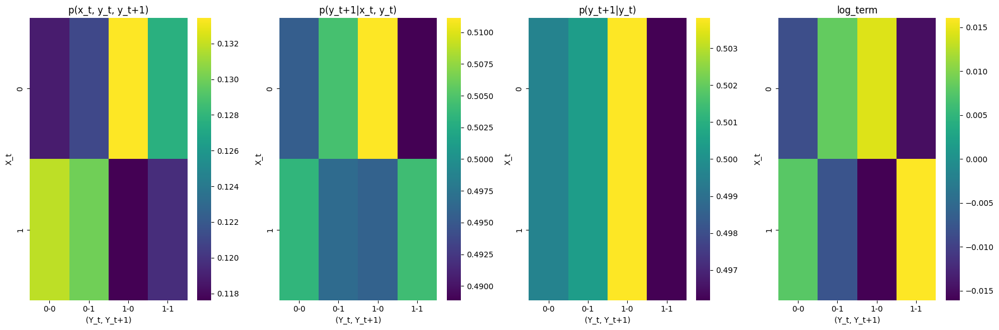

Transfer Entropy: 0.000075


In [46]:
np.random.seed(42)
X = np.random.randint(0, 2, 5000)
Y = np.random.randint(0, 2, 5000)

TE_value, _ = info_theory.transfer_entropy_vis(X, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print(f"Transfer Entropy: {TE_value:.6f}")

In [47]:
def pca_and_discretize(log_returns, tickers, num_bins, discretize_fn=preprocess.discretize, plot_explained_var_ratio=False):
    asset_classes_discrete = {}
    explained_variance_ratios = {}
    asset_classes = tickers.keys()
    for asset_class in asset_classes:
        vals = log_returns[tickers[asset_class]]
        pca, pca_components, explained_variance_ratio = preprocess.compute_pca(vals)
        explained_variance_ratios[asset_class] = explained_variance_ratio
        X = pca_components[:, 0]  # Take first principal component
        discrete_X = discretize_fn(X, num_bins)
        asset_classes_discrete[asset_class] = discrete_X

    dates = log_returns.index
    asset_classes_discrete = pd.DataFrame(asset_classes_discrete)
    asset_classes_discrete.index = dates
    asset_classes_discrete.index = pd.to_datetime(asset_classes_discrete.index)

    if plot_explained_var_ratio:
        for asset, variance_ratio in explained_variance_ratios.items():
            plt.plot(np.cumsum(variance_ratio), marker="o", label=asset)
        plt.xlabel("Number of Components")
        plt.ylabel("Cumulative Explained Variance")
        plt.title("PCA Explained Variance Ratios")
        plt.legend()
        plt.show()
    return asset_classes_discrete

In [48]:
def eff_measure(X, Y, measure, n_surrogates=100, *args, **kwargs):
    observed = measure(X, Y, *args, **kwargs)
    random_results = []
    for _ in range(n_surrogates):
        X_shuffled = np.random.permutation(X)
        random_results.append(measure(X_shuffled, Y, *args, **kwargs))
    return observed - np.mean(random_results)

In [49]:
def discretize(contin_data, num_bins=1):
    std = np.std(contin_data)
    bins = std * np.arange(-num_bins//2, num_bins//2 + 1)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=2, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 1
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]

In [50]:
asset_classes_discrete.index

DatetimeIndex(['2005-01-04', '2005-01-05', '2005-01-06', '2005-01-07',
               '2005-01-10', '2005-01-11', '2005-01-12', '2005-01-13',
               '2005-01-14', '2005-01-18',
               ...
               '2024-11-04', '2024-11-05', '2024-11-06', '2024-11-07',
               '2024-11-08', '2024-11-12', '2024-11-13', '2024-11-14',
               '2024-11-15', '2024-11-18'],
              dtype='datetime64[ns]', name='Date', length=4860, freq=None)

In [51]:
pd.Timestamp('2009-01-01')

Timestamp('2009-01-01 00:00:00')

In [52]:
asset_classes_discrete[asset_classes_discrete.index <= pd.Timestamp('2009-01-01')]

,commodity,credit,currency,energy,equity,interest,metals,real_estate,volatility
Date,,,,,,,,,
2005-01-04,0,0,3,2,0,2,1,1,2
2005-01-05,2,2,2,1,1,1,1,0,2
2005-01-06,1,1,3,3,2,1,1,2,1
2005-01-07,3,1,2,1,1,2,1,2,1
2005-01-10,2,2,1,2,2,2,2,1,2
...,...,...,...,...,...,...,...,...,...
2008-12-24,1,2,1,0,2,2,2,2,1
2008-12-26,2,3,1,3,2,1,3,2,1
2008-12-29,2,3,2,3,1,0,3,0,2


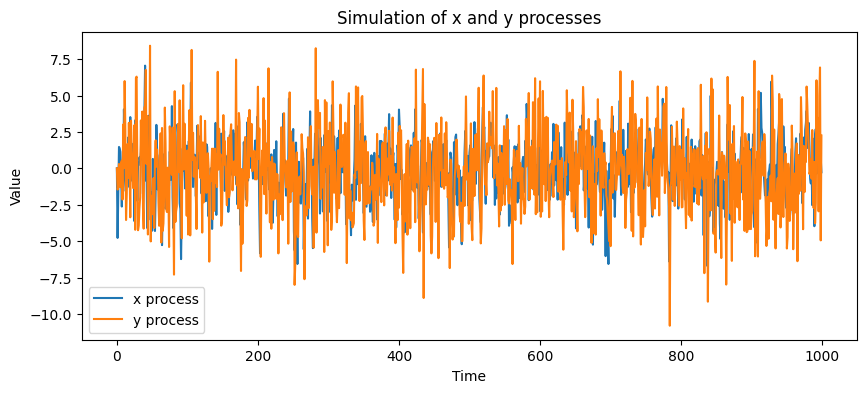

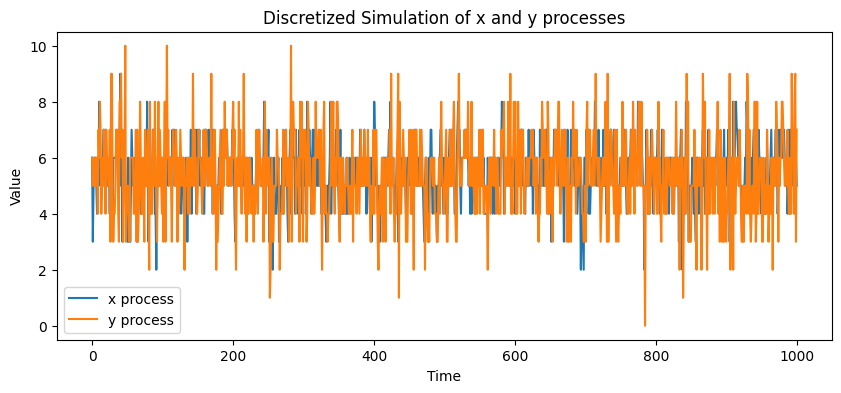

In [53]:
T = 1000
eps_x = np.random.normal(0, 2, T)
eps_y = np.random.normal(0, 2, T)
X = np.zeros(T)
Y = np.zeros(T)
for t in range(1, T):
    X[t] = 0.2 * X[t-1] + eps_x[t]
    Y[t] = X[t-1] + eps_y[t]

plt.figure(figsize=(10, 4))
plt.plot(X, label='x process')
plt.plot(Y, label='y process')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Simulation of x and y processes')
plt.legend()
plt.show()

bins = np.linspace(-10, 10, 11)
X_disc = np.digitize(X, bins)
Y_disc = np.digitize(Y, bins)

plt.figure(figsize=(10, 4))
plt.plot(X_disc, label='x process')
plt.plot(Y_disc, label='y process')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Discretized Simulation of x and y processes')
plt.legend()
plt.show()

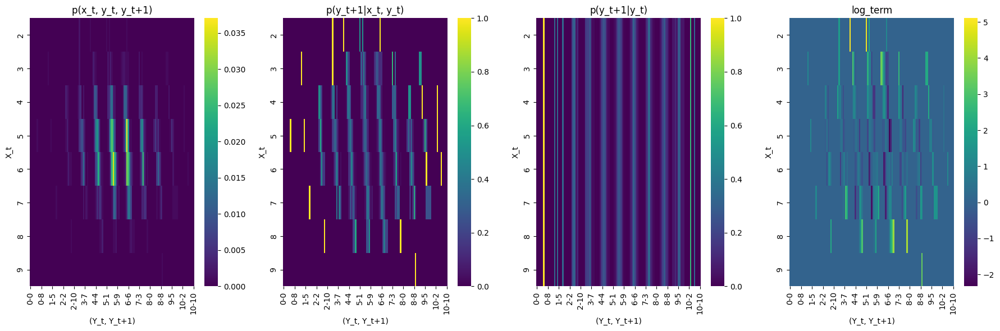

0.39905162254642473


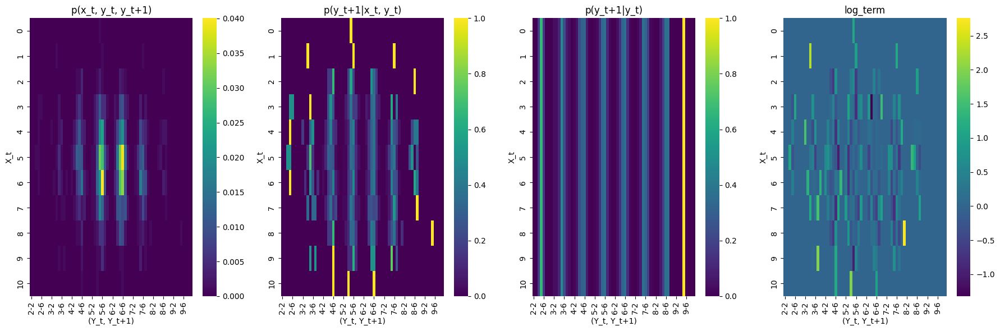

0.10474837837233908


In [54]:
TE_value, _ = info_theory.transfer_entropy_vis(X_disc, Y_disc, k=1, l=1, 
                                               probabilities=True, plot_diagnostics=True)
print(TE_value)
TE_value, _ = info_theory.transfer_entropy_vis(Y_disc, X_disc, k=1, l=1,
                                               probabilities=True, plot_diagnostics=True)
print(TE_value)

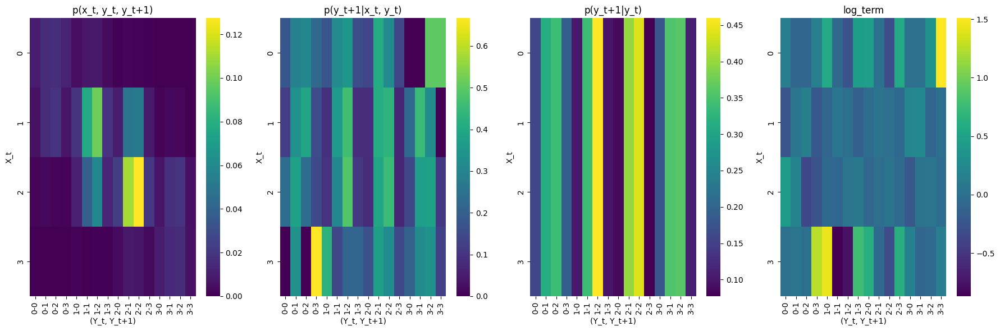

Transfer Entropy: 0.009005948232862413
2686


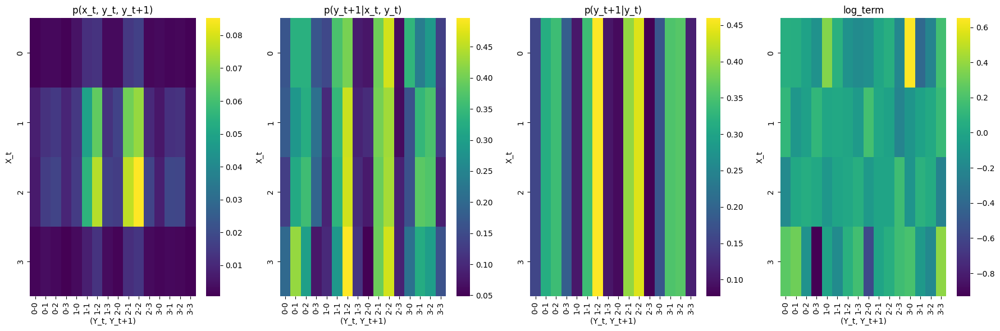

Transfer Entropy: 0.0041761279259423835


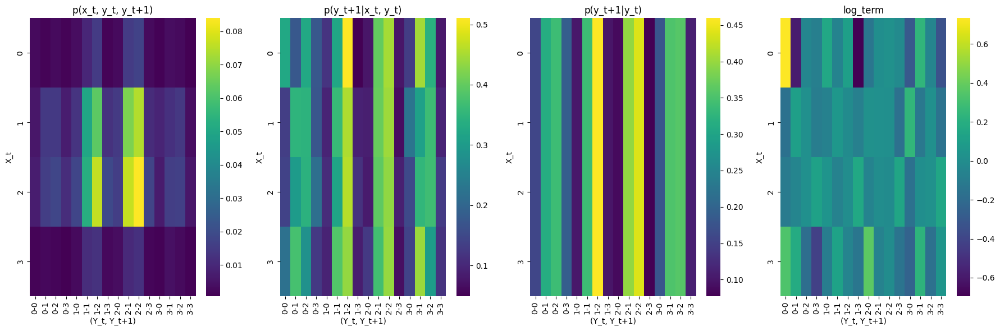

Transfer Entropy: 0.004285548188674187


In [55]:
X = asset_classes_discrete['real_estate'].values
Y = asset_classes_discrete['equity'].values
TE_value, _ = info_theory.transfer_entropy_vis(X, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

shift = np.random.randint(len(X))
print(shift)
X_shifted = np.roll(X, shift)
TE_value, _ = info_theory.transfer_entropy_vis(X_shifted, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

X_shuffled = np.random.permutation(X)
TE_value, _ = info_theory.transfer_entropy_vis(X_shuffled, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

In [82]:
def discretize(contin_data, num_bins=1):
    std = np.std(contin_data)
    bins = std * np.arange(-num_bins//2, num_bins//2 + 1)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=12, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 1
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
mi_matrix = plotting.compute_measure_matrix(windows, info_theory.MI)
mi_dict = plotting.measure_matrix_to_dict(mi_matrix, assets)

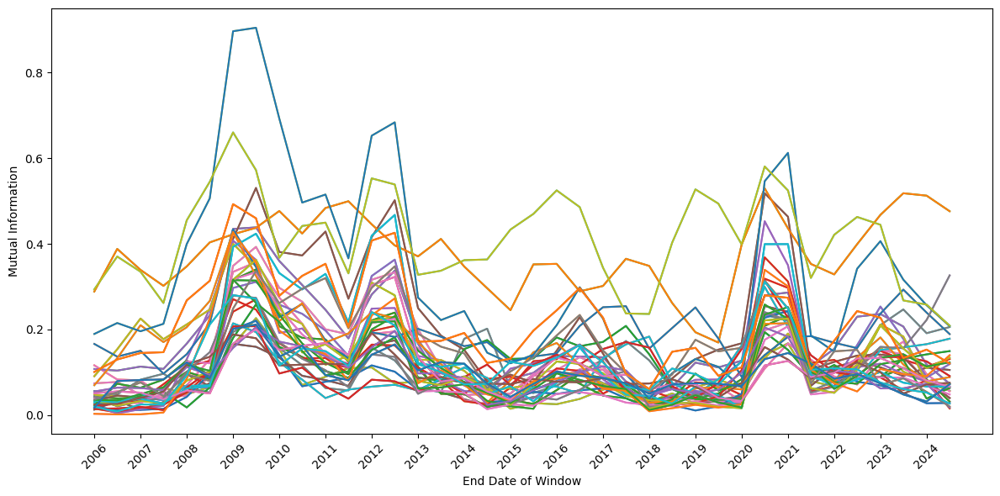

<Figure size 1000x400 with 0 Axes>

interactive(children=(Dropdown(description='asset1', options=('commodity', 'credit', 'currency', 'energy', 'eq…

<function plotting.create_interactive_pair_plot.<locals>.plot_fn(asset1, asset2)>

In [84]:
plotting.plot_measure_evolution(mi_dict, endpoints, assets, "Mutual Information")
plotting.create_interactive_pair_plot(mi_dict, endpoints, assets, "Mutual Information")

In [58]:
te_matrix = plotting.compute_measure_matrix(windows, info_theory.transfer_entropy_fast, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)

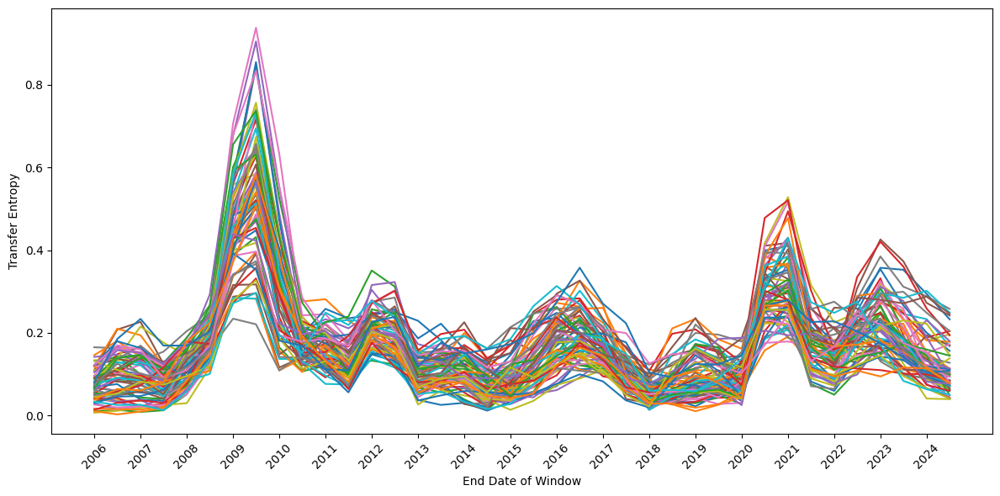

In [59]:
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")


In [60]:
def compute_measure_matrix(windows, measure_func, n_surrogates=0, *measure_args, **measure_kwargs):
    """
    Generalized matrix computation for any pairwise measure
    
    Parameters:
        windows: iterable of (start_date, end_date, window_data)
        measure_func: function that takes two arrays and returns a scalar
        measure_kwargs: keyword arguments for measure_func
        
    Returns:
        measure_matrix: numpy array of shape (n_assets, n_assets, num_windows)
    """
    assets = windows[0][2].columns
    n = len(assets)
    num_windows = len(windows)
    measure_matrix = np.empty((n, n, num_windows))
    surrogate_matrix = np.empty((n_surrogates, n, n, num_windows))
    for t, (_, _, window_data) in enumerate(windows):
        for i, asset1 in enumerate(assets):
            for j, asset2 in enumerate(assets):
                if asset1 == asset2:
                    measure_matrix[i, j, t] = 0.0
                else:
                    measure_matrix[i, j, t] = measure_func(
                        window_data[asset1].values,
                        window_data[asset2].values,
                        *measure_args,
                        **measure_kwargs
                    )

                for k in range(n_surrogates):
                    if asset1 == asset2:
                        surrogate_matrix[k, i, j, t] = 0.0
                    else:
                        surrogate_matrix[k, i, j, t] = measure_func(
                            np.roll(window_data[asset1].values, np.random.randint(len(window_data[asset1]))),
                            window_data[asset2].values,
                            *measure_args,
                            **measure_kwargs
                        )
        #print(f"Window {t+1}/{num_windows} computed")
    avg_surrogate_matrix = np.mean(surrogate_matrix, axis=0)
        
    return measure_matrix, avg_surrogate_matrix

In [61]:
from functools import partial
eff_te = partial(
    eff_measure,
    measure = info_theory.transfer_entropy_fast,
    n_surrogates=20
)

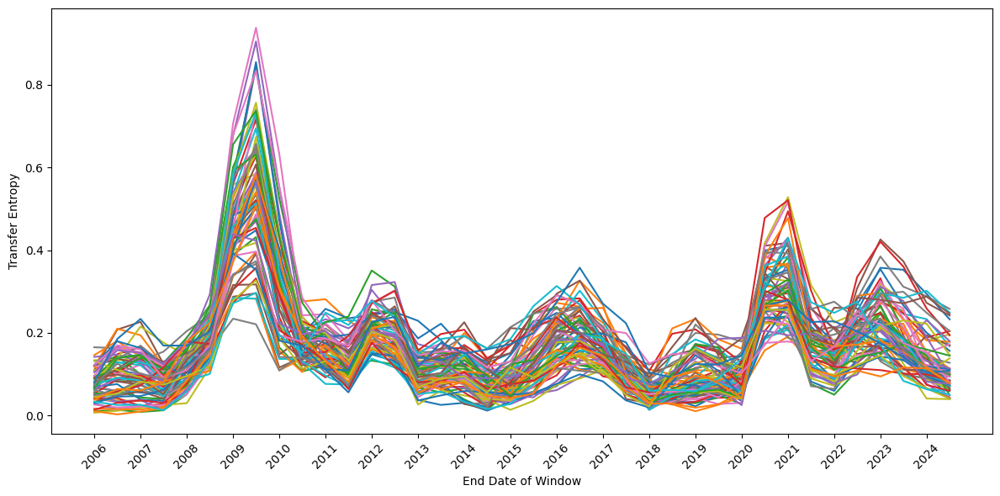

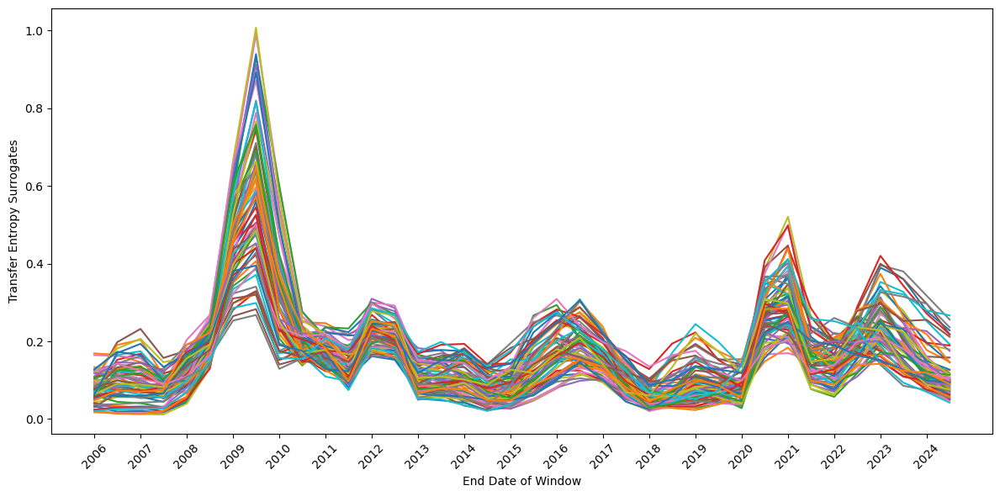

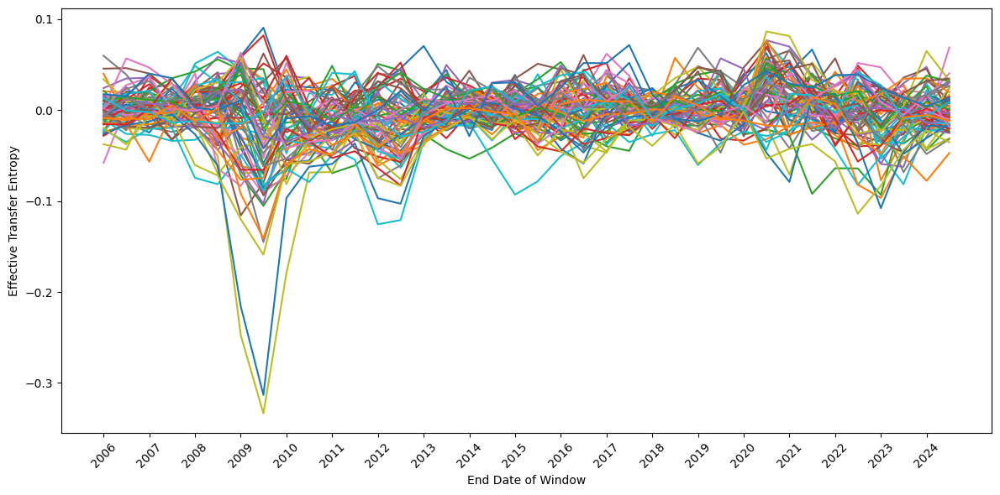

In [63]:
def discretize(contin_data, num_bins=1):
    std = np.std(contin_data)
    bins = std * np.arange(-num_bins//2, num_bins//2 + 1)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=12, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 1
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=100, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

In [ ]:
plotting.create_interactive_pair_plot(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

<Figure size 1000x400 with 0 Axes>

interactive(children=(Dropdown(description='asset1', options=('commodity', 'credit', 'currency', 'energy', 'eq…

<function plotting.create_interactive_pair_plot.<locals>.plot_fn(asset1, asset2)>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

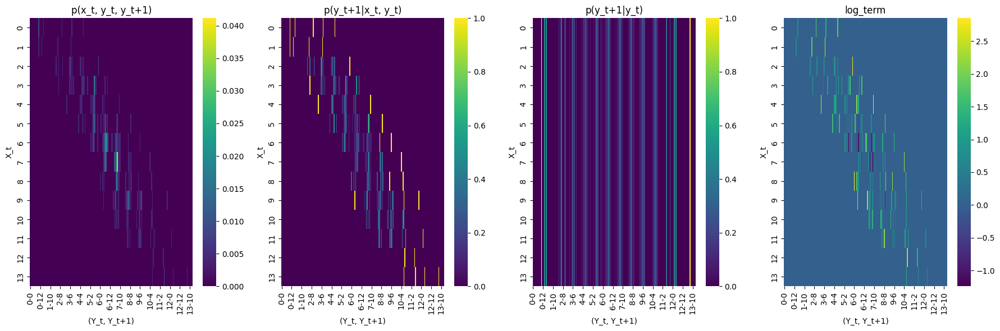

Transfer Entropy: 0.5922207579269118
225


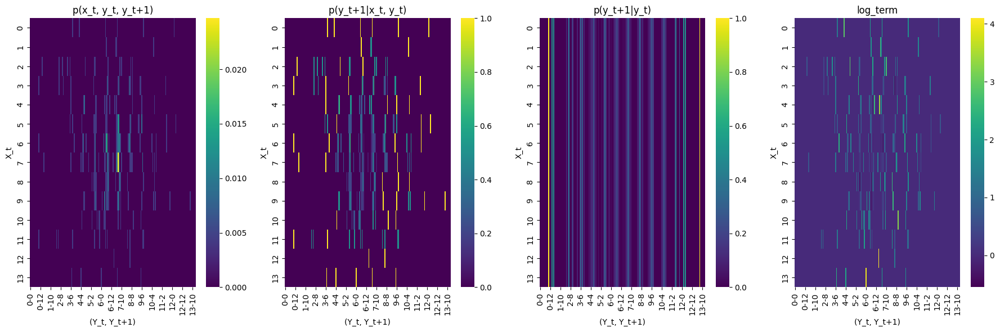

Transfer Entropy: 0.9007778365966856


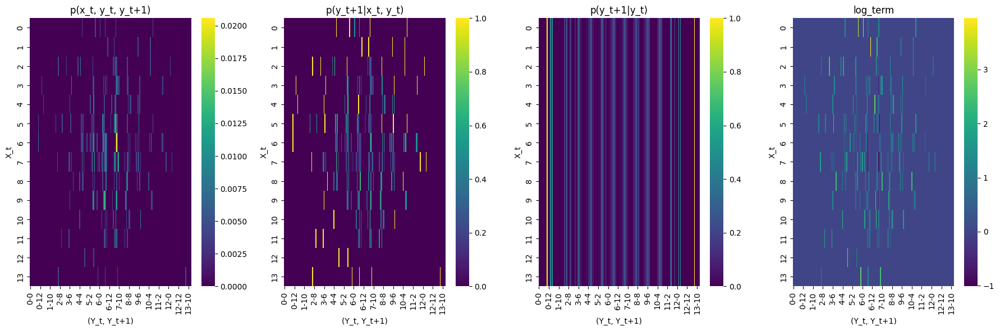

Transfer Entropy: 0.9516559300957438


In [25]:
peak_window = windows[7][2]
X = peak_window['real_estate'].values
Y = peak_window['equity'].values
TE_value, _ = info_theory.transfer_entropy_vis(X, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

shift = np.random.randint(len(X))
print(shift)
X_shifted = np.roll(X, shift)
TE_value, _ = info_theory.transfer_entropy_vis(X_shifted, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

X_shuffled = np.random.permutation(X)
TE_value, _ = info_theory.transfer_entropy_vis(X_shuffled, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

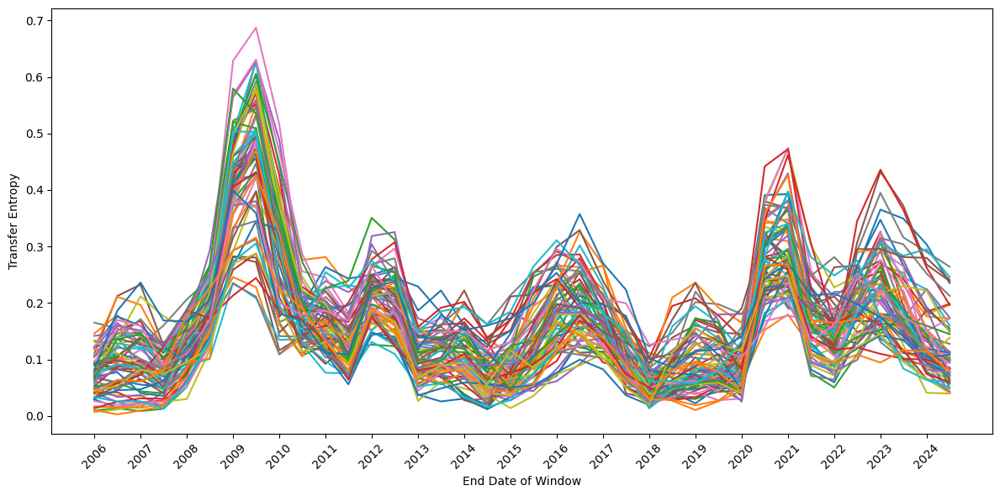

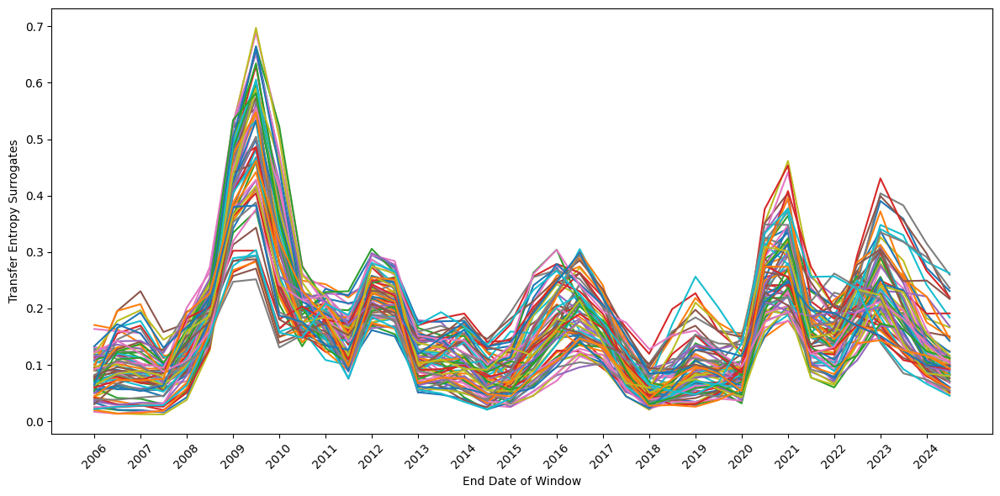

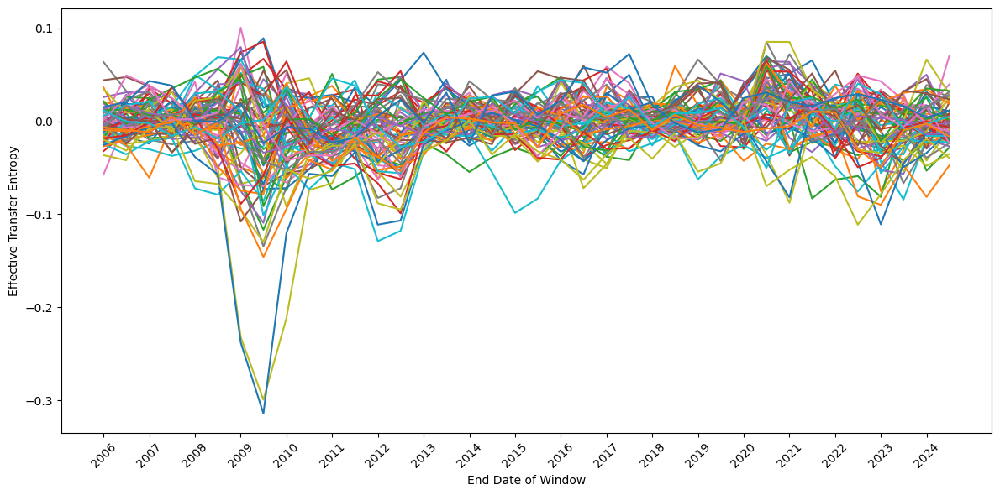

In [95]:
def discretize(contin_data, num_bins=1):
    std = np.std(contin_data)
    bins = std * np.arange(-num_bins//2, num_bins//2 + 1)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=6, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 1
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=100, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

In [96]:
plotting.create_interactive_pair_plot(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

<Figure size 1000x400 with 0 Axes>

interactive(children=(Dropdown(description='asset1', options=('commodity', 'credit', 'currency', 'energy', 'eq…

<function plotting.create_interactive_pair_plot.<locals>.plot_fn(asset1, asset2)>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

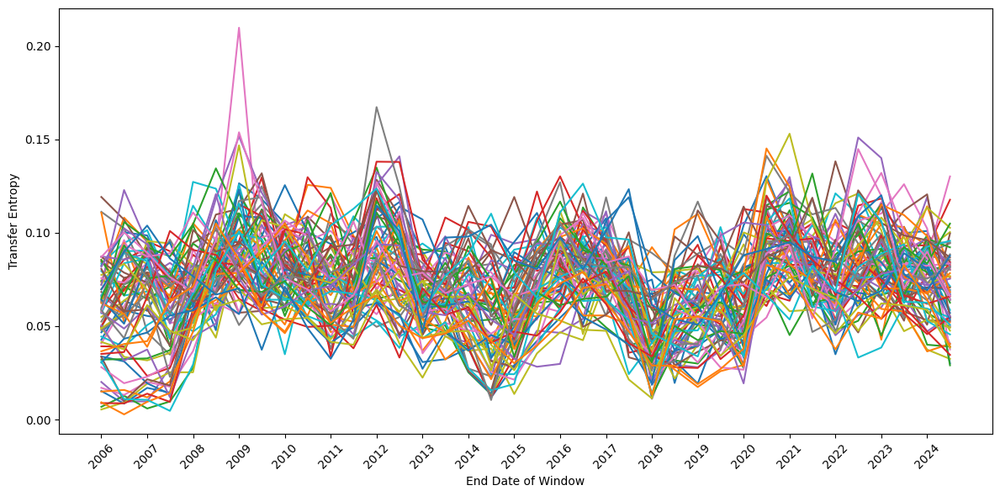

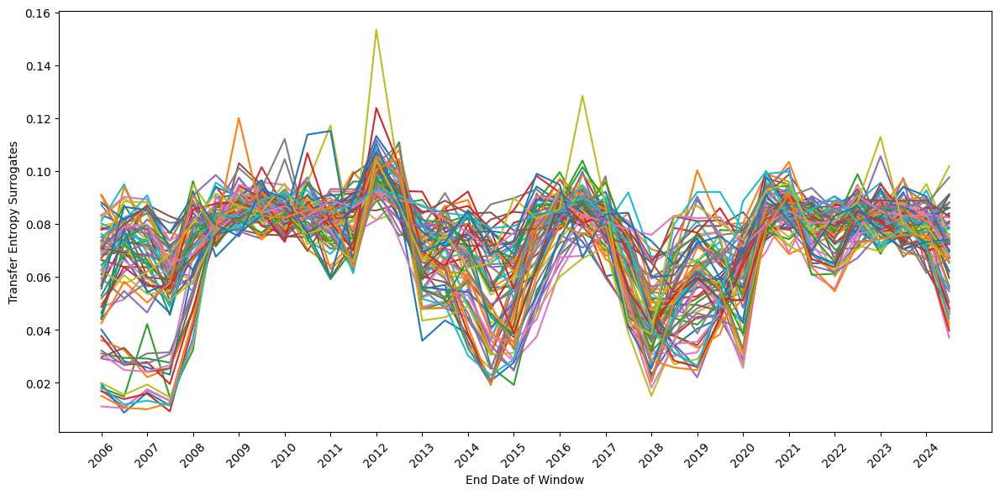

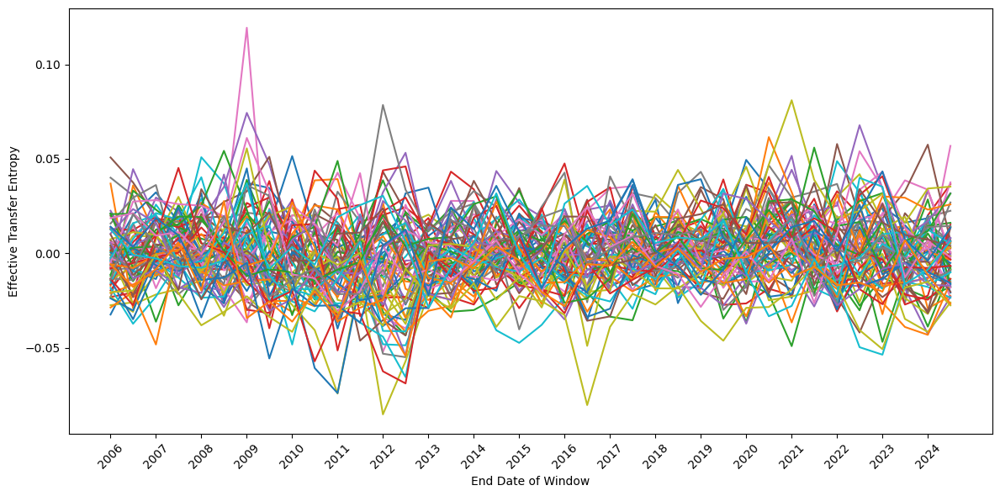

In [ ]:
def discretize(contin_data, num_bins=1):
    std = np.std(contin_data)
    bins = std * np.arange(-num_bins//2, num_bins//2 + 1)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=2, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 1
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=100, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

In [91]:
plotting.create_measure_heatmap(eff_te_matrix, assets, endpoints, "Effective Transfer Entropy")

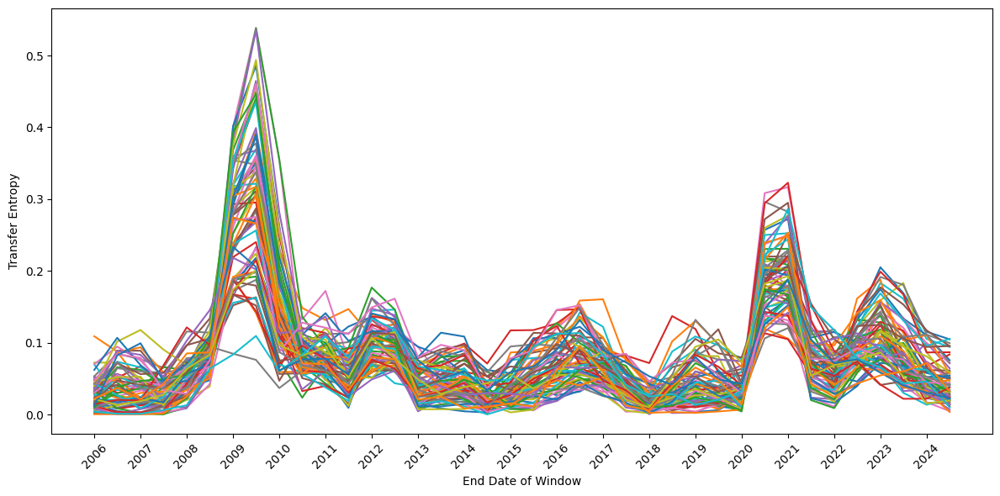

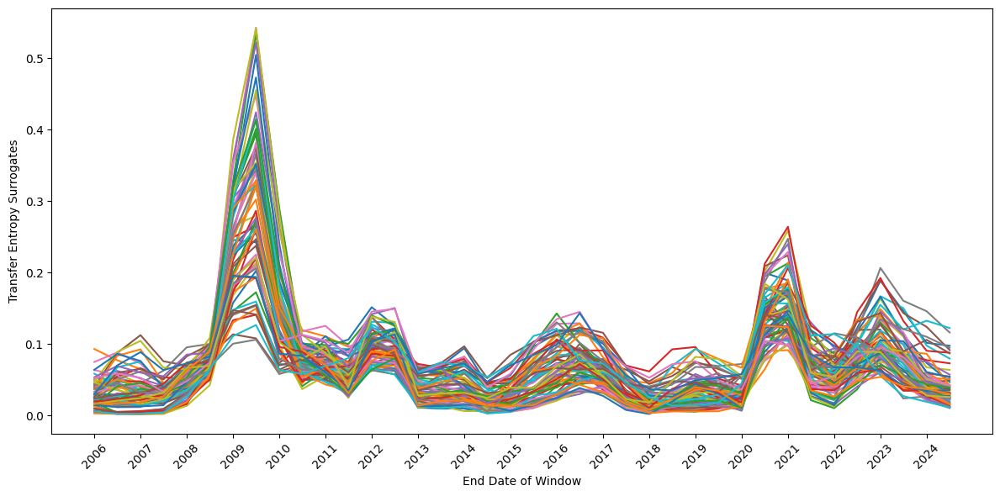

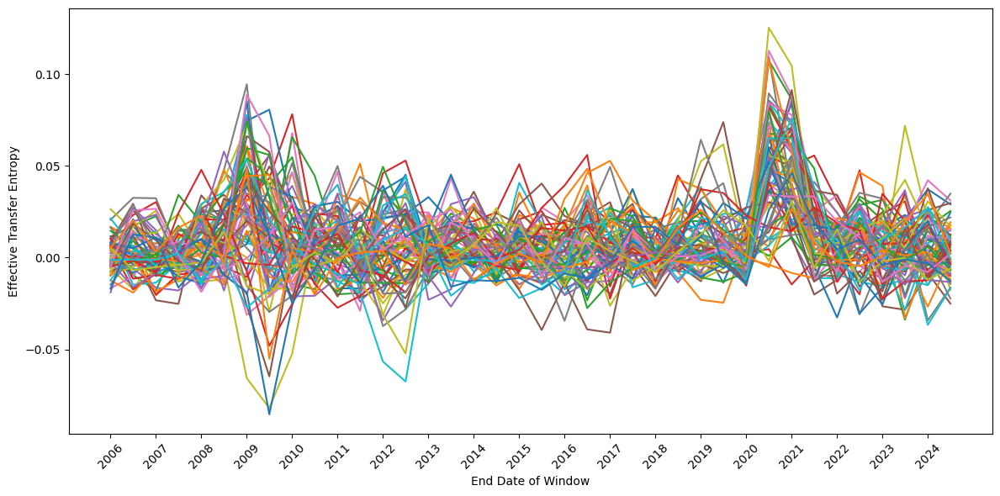

In [74]:
def discretize(contin_data, num_bins=1):
    contin_data = np.abs(contin_data)
    std = np.std(contin_data)
    bins = std * np.arange(0, num_bins)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=12, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 12
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="months", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

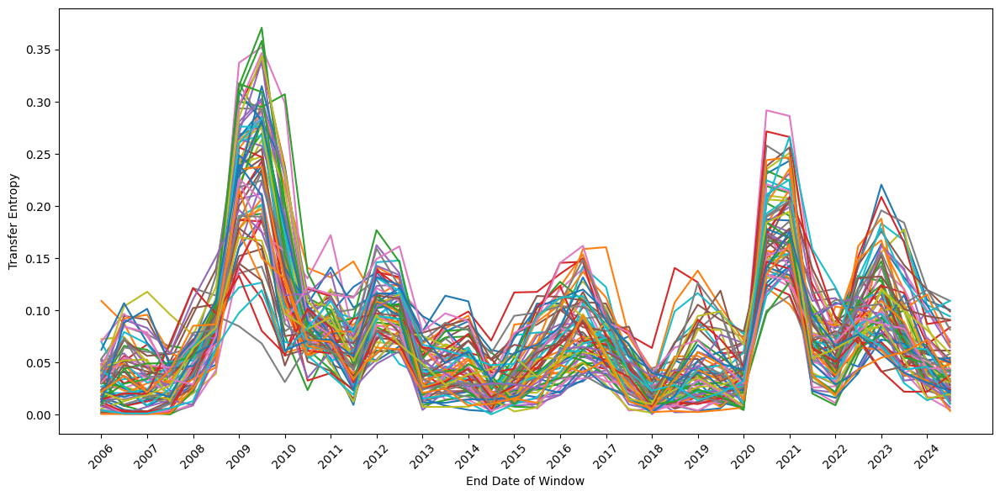

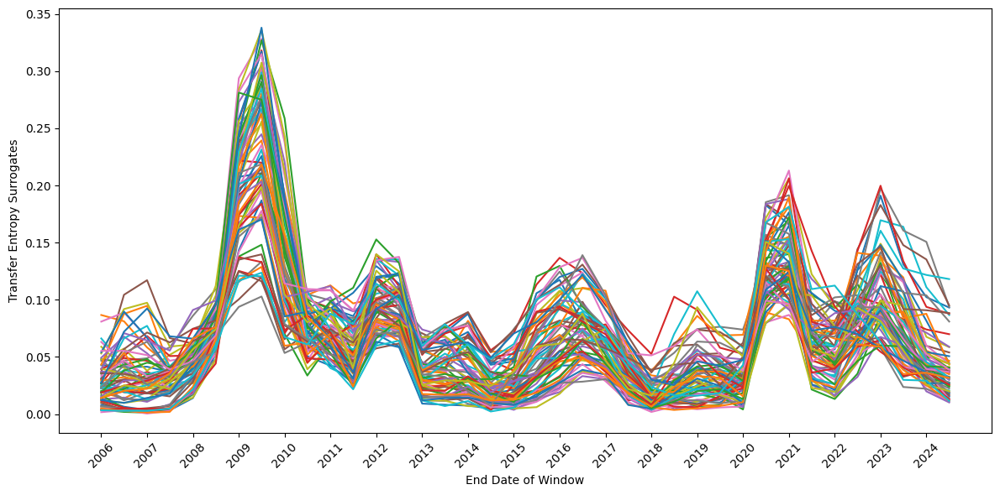

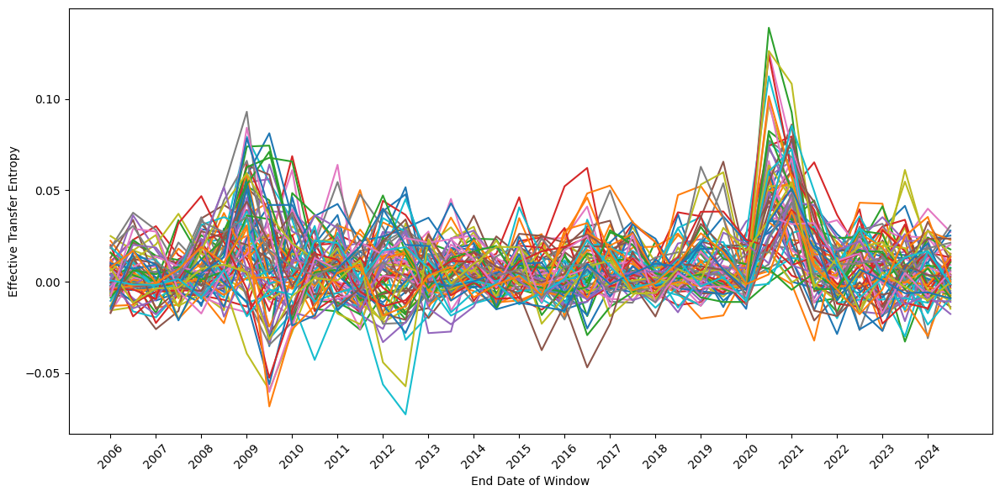

In [97]:
def discretize(contin_data, num_bins=1):
    contin_data = np.abs(contin_data)
    std = np.std(contin_data)
    bins = std * np.arange(0, num_bins)
    return np.digitize(contin_data, bins)

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=6, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 12
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="months", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")


In [98]:
plotting.create_measure_heatmap(eff_te_matrix, assets, endpoints, "Effective Transfer Entropy")

In [99]:
plotting.create_interactive_pair_plot(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

<Figure size 1000x400 with 0 Axes>

interactive(children=(Dropdown(description='asset1', options=('commodity', 'credit', 'currency', 'energy', 'eq…

<function plotting.create_interactive_pair_plot.<locals>.plot_fn(asset1, asset2)>

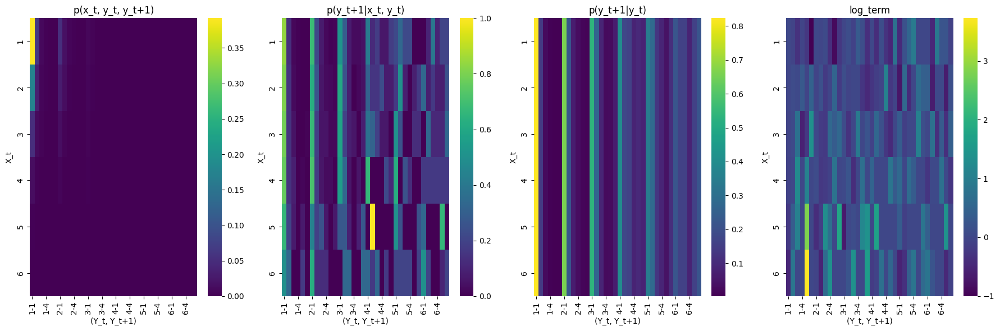

Transfer Entropy: 0.018887666812816263
3480


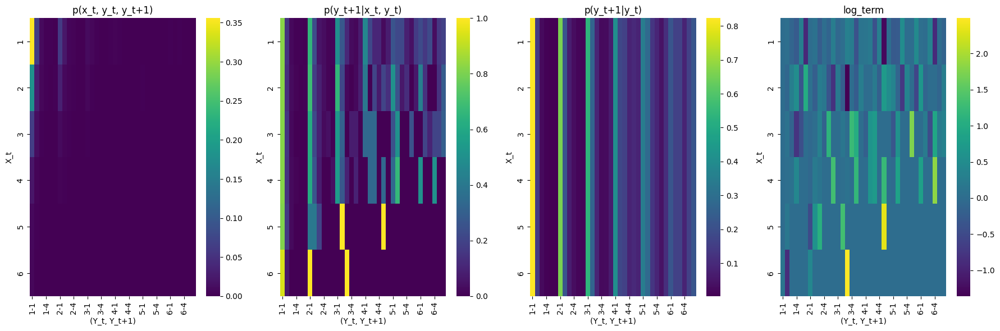

Transfer Entropy: 0.013959046576591276


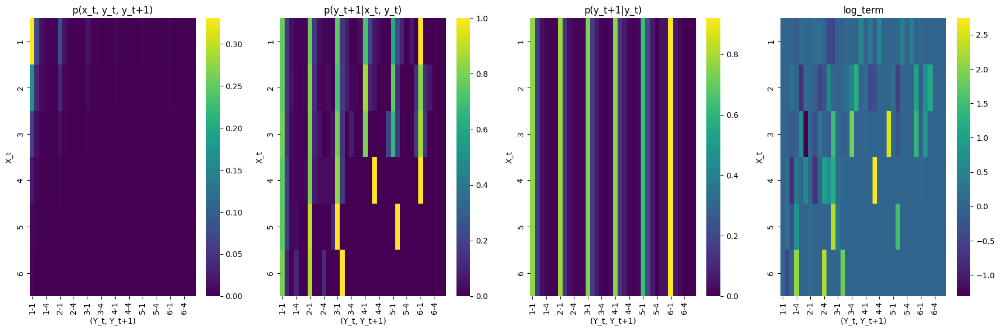

Transfer Entropy: 0.011998834260108513


In [89]:
X = asset_classes_discrete['currency'].values
Y = asset_classes_discrete['real_estate'].values
TE_value, _ = info_theory.transfer_entropy_vis(X, Y, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

shift = np.random.randint(len(X))
print(shift)
Y_shifted = np.roll(Y, shift)
TE_value, _ = info_theory.transfer_entropy_vis(X, Y_shifted, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

Y_shuffled = np.random.permutation(Y)
TE_value, _ = info_theory.transfer_entropy_vis(X, Y_shuffled, k=1, l=1, probabilities=True, plot_diagnostics=True)
print("Transfer Entropy:", TE_value)

[0.  0.1 0.2 0.8 0.9 1. ]
[-12.7161901   -1.79351888  -1.03822904   1.08402786   1.80452112
  11.08911016]
[0.  0.1 0.2 0.8 0.9 1. ]
[-18.35043549  -1.96247517  -1.17188356   1.19960603   1.8547754
  14.25303658]
[0.  0.1 0.2 0.8 0.9 1. ]
[-8.39789988 -1.61274887 -1.01838499  1.0107265   1.64304422  7.37251887]
[0.  0.1 0.2 0.8 0.9 1. ]
[-16.88559405  -1.38457164  -0.77631325   0.82566103   1.32202769
   8.36642271]
[0.  0.1 0.2 0.8 0.9 1. ]
[-24.36796787  -2.50105839  -1.33244692   1.46764116   2.35737531
  16.39764675]
[0.  0.1 0.2 0.8 0.9 1. ]
[-8.74493307 -1.44095869 -0.8515019   0.8849454   1.45500746 10.25826236]
[0.  0.1 0.2 0.8 0.9 1. ]
[-16.54885723  -1.3121083   -0.73085535   0.76092517   1.2613774
  12.72151998]
[0.  0.1 0.2 0.8 0.9 1. ]
[-6.85545713 -1.48061025 -0.94104752  0.88386189  1.5558687  12.5812468 ]


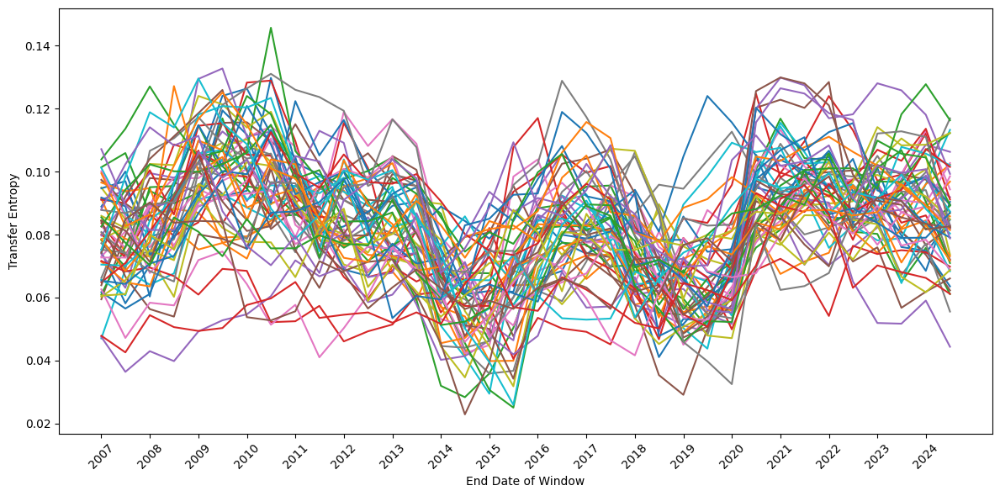

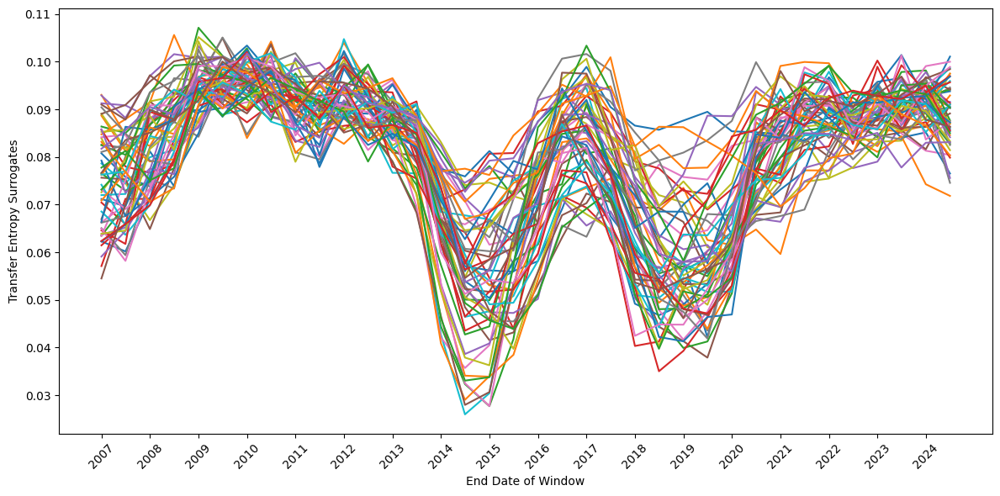

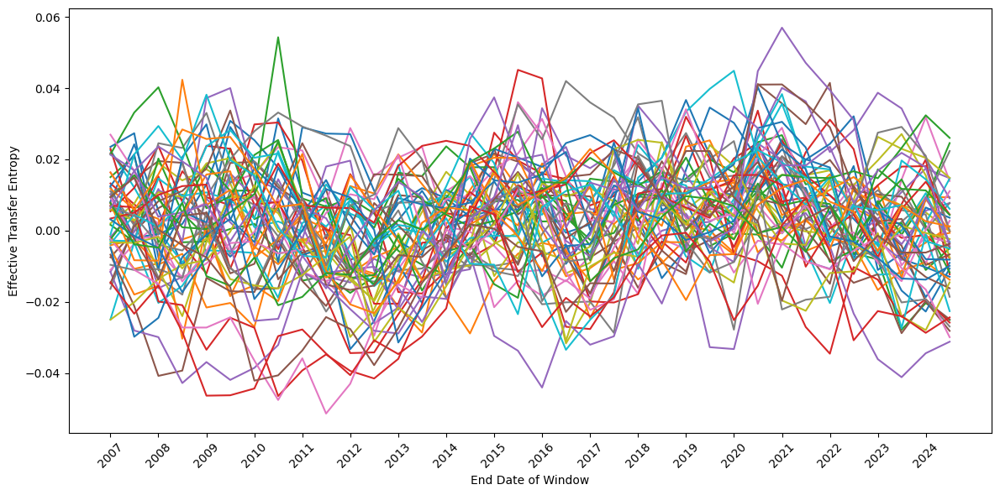

In [187]:
def discretize(contin_data, num_bins=12):
    alpha = 0.2
    left = np.linspace(0, alpha, (num_bins)//2)
    right = (1 - left)[::-1]
    # Create quantile-based bins
    quantiles = np.hstack((left, right))
    print(quantiles)
    bins = np.quantile(contin_data, quantiles)
    print(bins)
    discretized = np.digitize(contin_data, bins)
        
    return discretized

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=6, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 2
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

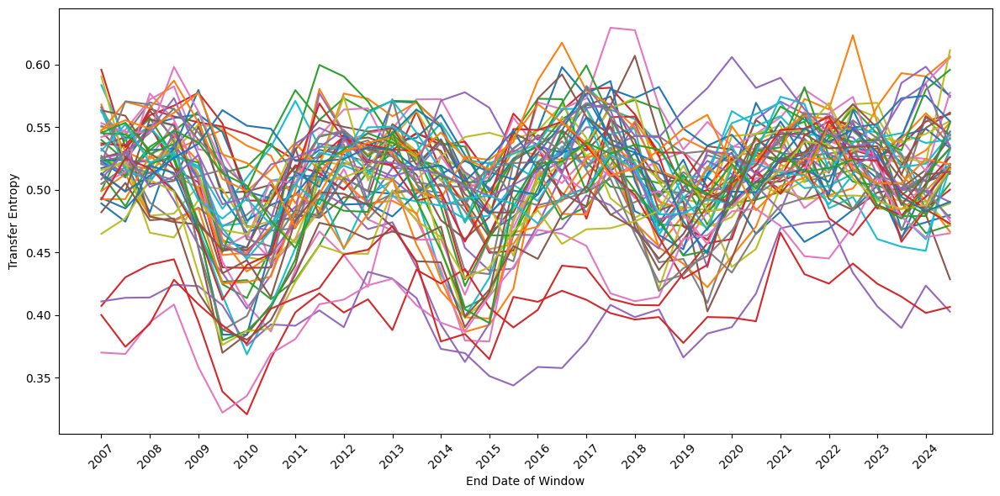

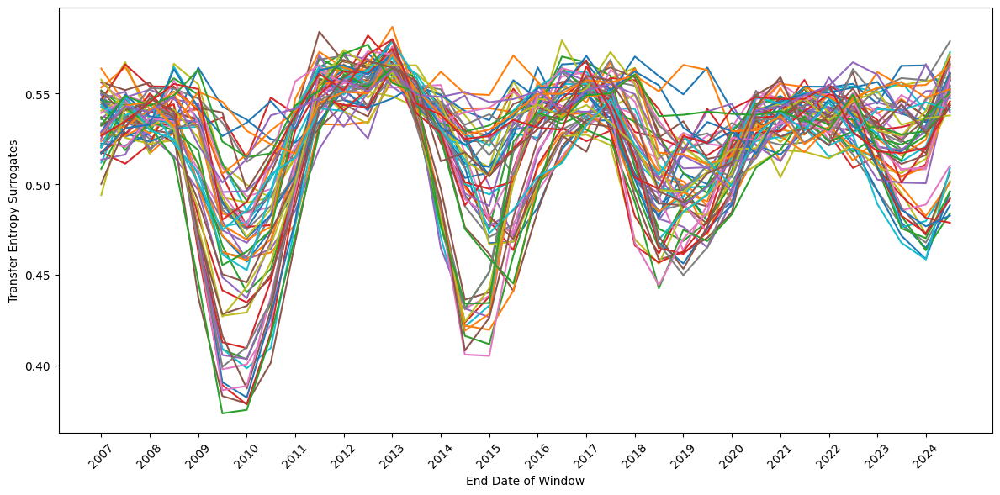

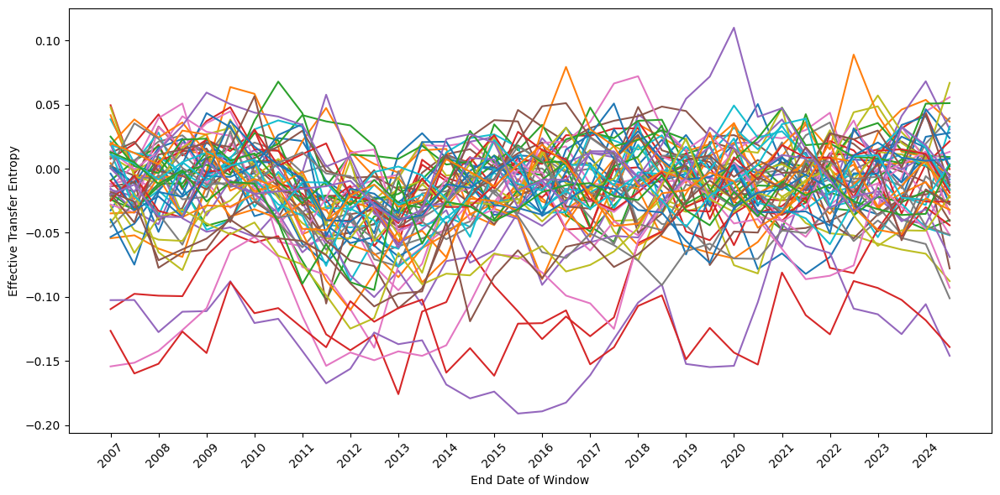

In [194]:
def discretize(contin_data, num_bins=6):
    # Create quantile-based bins so that each bin contains roughly equal number of data points.
    quantiles = np.linspace(0, 100, num_bins + 1)
    bins = np.percentile(contin_data, quantiles)
    # Avoid duplicate bin edges in case of ties.
    bins = np.unique(bins)
    discretized = np.digitize(contin_data, bins[1:-1])
        
    return discretized

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=5, discretize_fn=discretize, plot_explained_var_ratio=False)
window_len = 2
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=2, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

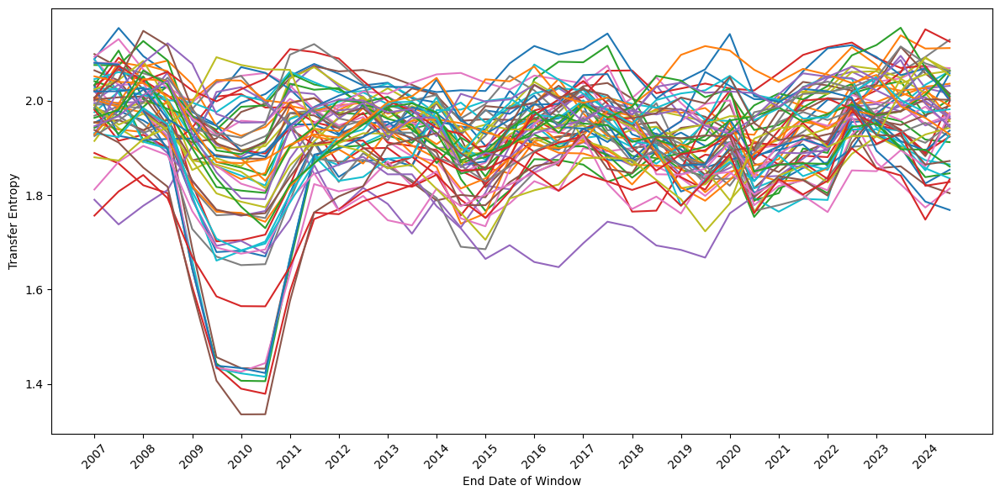

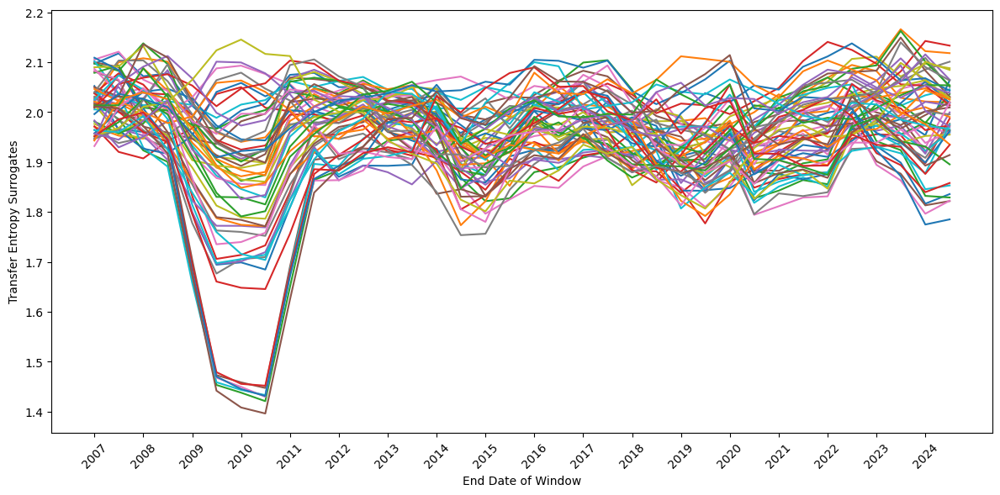

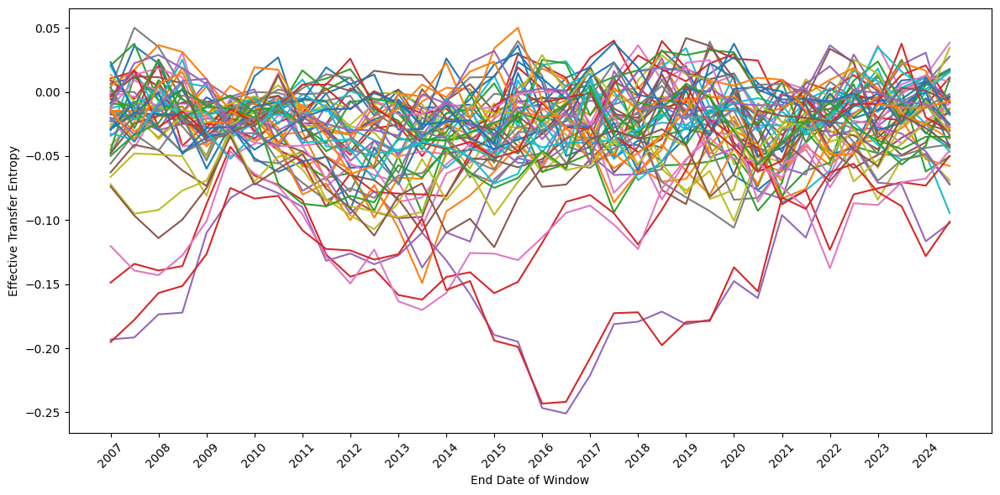

In [79]:
def bin_data_with_iqr(data, num_bins=3):
    """
    Bins data into N discrete bins using the Interquartile Range (IQR).
    
    Parameters:
        data (array-like): The input data to be binned (e.g., log returns).
        num_bins (int): The number of discrete bins desired.
        
    Returns:
        binned_data (array): Array of binned data.
        bin_edges (array): The edges of the bins used for discretization.
    """
    # Convert data to a NumPy array
    data = np.array(data)
    
    # Calculate the IQR
    q1 = np.percentile(data, 25)  # 25th percentile
    q3 = np.percentile(data, 75)  # 75th percentile
    iqr = q3 - q1
    
    # Define bin width based on IQR
    bin_width = iqr / num_bins
    
    # Define the range of bins
    min_value = np.min(data)
    max_value = np.max(data)
    
    # Create bin edges starting from min_value to max_value with step size bin_width
    bin_edges = np.arange(min_value, max_value + bin_width, bin_width)
    
    # Digitize the data into bins
    binned_data = np.digitize(data, bin_edges, right=False)
    
    return binned_data

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=12, 
                                            discretize_fn=bin_data_with_iqr, plot_explained_var_ratio=False)
window_len = 2
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")

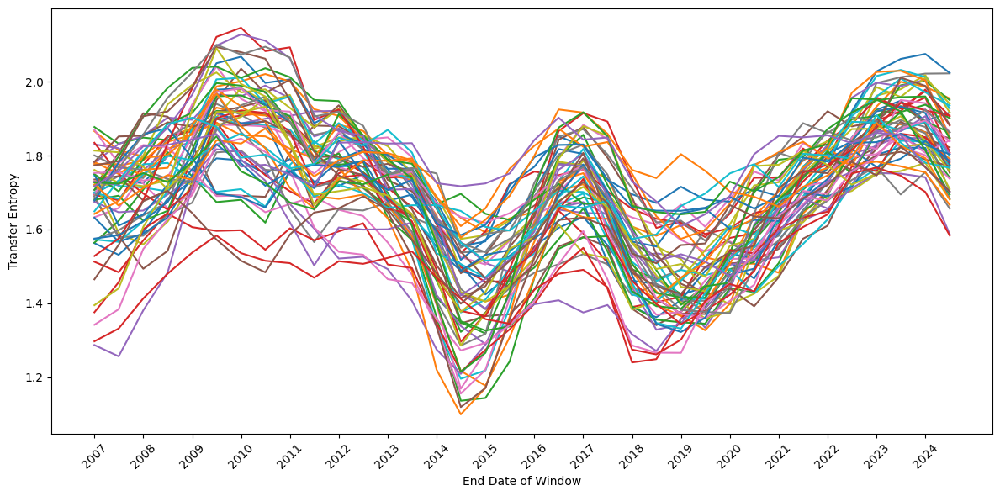

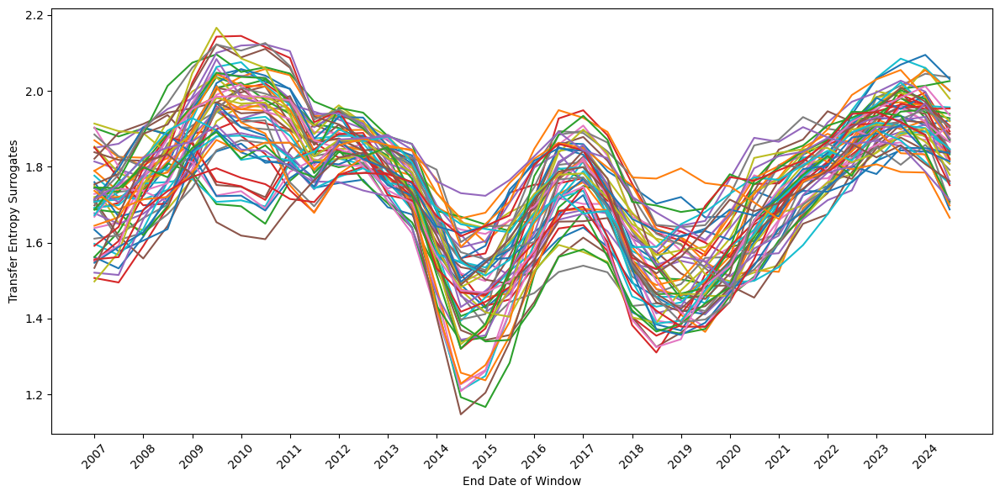

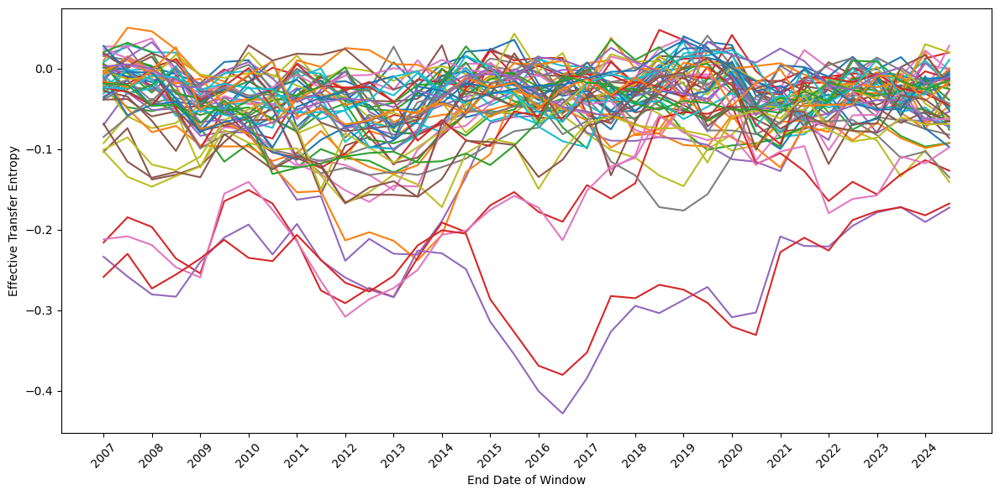

In [80]:
def bin_data_with_iqr(data, num_bins=3):
    """
    Bins data into N discrete bins using the Interquartile Range (IQR).
    
    Parameters:
        data (array-like): The input data to be binned (e.g., log returns).
        num_bins (int): The number of discrete bins desired.
        
    Returns:
        binned_data (array): Array of binned data.
        bin_edges (array): The edges of the bins used for discretization.
    """
    # Convert data to a NumPy array
    data = np.array(data)
    
    # Calculate the IQR
    q1 = np.percentile(data, 25)  # 25th percentile
    q3 = np.percentile(data, 75)  # 75th percentile
    iqr = q3 - q1
    
    # Define bin width based on IQR
    bin_width = iqr / num_bins
    
    # Define the range of bins
    min_value = np.min(data)
    max_value = np.max(data)
    
    # Create bin edges starting from min_value to max_value with step size bin_width
    bin_edges = np.arange(min_value, max_value + bin_width, bin_width)
    
    # Digitize the data into bins
    binned_data = np.digitize(data, bin_edges, right=False)
    
    return binned_data

asset_classes_discrete = pca_and_discretize(log_returns, tickers, num_bins=7, 
                                            discretize_fn=bin_data_with_iqr, plot_explained_var_ratio=False)
window_len = 2
window_step = 6
windows = preprocess.sliding_window(asset_classes_discrete, 
                                    window_len, 
                                    window_step, 
                                    window_unit="years", 
                                    step_unit="months")
endpoints = [end_date for _, end_date, _ in windows]
te_matrix, te_matrix_surrogate = compute_measure_matrix(windows, measure_func=info_theory.transfer_entropy_fast, 
                                                        n_surrogates=10, k=1, l=1)
te_dict = plotting.measure_matrix_to_dict(te_matrix, assets)
te_dict_surrogate = plotting.measure_matrix_to_dict(te_matrix_surrogate, assets)
plotting.plot_measure_evolution(te_dict, endpoints, assets, "Transfer Entropy")
plotting.plot_measure_evolution(te_dict_surrogate, endpoints, assets, "Transfer Entropy Surrogates")
eff_te_matrix = te_matrix - te_matrix_surrogate
eff_te_dict = plotting.measure_matrix_to_dict(eff_te_matrix, assets)
plotting.plot_measure_evolution(eff_te_dict, endpoints, assets, "Effective Transfer Entropy")